In [16]:
import cv2
import numpy as np
import matplotlib.pyplot as plt
from skimage.morphology import skeletonize
from skimage.measure import label, regionprops


def preprocess_image(image: np.ndarray) -> np.ndarray:
    """
    Preprocessing Step:
    - Extract red channel
    - Apply 3x3 median filter
    - Scale by factor 1.64

    Args:
        image (np.ndarray): Input RGB image

    Returns:
        np.ndarray: Scaled red channel image (I_new_red)
    """
    if image.ndim != 3 or image.shape[2] != 3:
        raise ValueError("Input image must be an RGB image")

    red_channel = image[:, :, 2]  # OpenCV uses BGR format
    red_channel_smoothed = cv2.medianBlur(red_channel, 9)
    red_channel_scaled = np.clip(1.04 * red_channel_smoothed, 0, 255).astype(np.uint8)

    return red_channel_scaled

def apply_horizontal_filter(I_red_scaled: np.ndarray, blue_plane: np.ndarray) -> np.ndarray:
    """
    Applies horizontal filtering to detect vertical hair.
    Returns an image with replaced hair pixels.
    """
    filtered = I_red_scaled.copy()
    rows, cols = I_red_scaled.shape

    for r in range(rows):
        for c in range(3, cols - 3):  # 1x7 window
            window = I_red_scaled[r, c - 3:c + 4]
            if np.ptp(window) > 5:  # Peak-to-peak value (max - min)
                min_idx = np.argmin(window)
                min_pos = c - 3 + min_idx

                # Define 5x7 mask panels around min_pos
                if 2 < min_pos < cols - 3:
                    panel_left = I_red_scaled[r-2:r+3, min_pos-3:min_pos-1] if r >= 2 and r < rows - 2 else None
                    panel_right = I_red_scaled[r-2:r+3, min_pos+1:min_pos+3] if r >= 2 and r < rows - 2 else None
                    panel_center = I_red_scaled[r-2:r+3, min_pos-1:min_pos+2] if r >= 2 and r < rows - 2 else None

                    if panel_left is not None and panel_right is not None and panel_center is not None:
                        med_left = np.median(panel_left)
                        med_right = np.median(panel_right)
                        avg_outer = (med_left + med_right) / 2.0
                        avg_center = np.mean(panel_center)

                        # Additional condition on blue channel
                        blue_patch = blue_plane[r-2:r+3, min_pos-1:min_pos+2]
                        if avg_center < med_left and avg_center < med_right and np.mean(blue_patch) < 130: #130
                            filtered[r-2:r+3, min_pos-1:min_pos+2] = avg_outer

    return filtered

def apply_vertical_filter(I_red_scaled: np.ndarray, blue_plane: np.ndarray) -> np.ndarray:
    """
    Applies vertical filtering to detect horizontal hair.
    Returns an image with replaced hair pixels.
    """
    filtered = I_red_scaled.copy()
    rows, cols = I_red_scaled.shape

    for c in range(cols):
        for r in range(3, rows - 3):  # 1x7 window vertically
            window = I_red_scaled[r - 3:r + 4, c]
            if np.ptp(window) > 30:
                min_idx = np.argmin(window)
                min_pos = r - 3 + min_idx

                # Define 5x7 mask panels around min_pos
                if 2 < min_pos < rows - 3:
                    panel_top = I_red_scaled[min_pos-3:min_pos-1, c-2:c+3] if c >= 2 and c < cols - 2 else None
                    panel_bottom = I_red_scaled[min_pos+1:min_pos+3, c-2:c+3] if c >= 2 and c < cols - 2 else None
                    panel_center = I_red_scaled[min_pos-1:min_pos+2, c-2:c+3] if c >= 2 and c < cols - 2 else None

                    if panel_top is not None and panel_bottom is not None and panel_center is not None:
                        med_top = np.median(panel_top)
                        med_bottom = np.median(panel_bottom)
                        avg_outer = (med_top + med_bottom) / 2.0
                        avg_center = np.mean(panel_center)

                        blue_patch = blue_plane[min_pos-1:min_pos+2, c-2:c+3]
                        if avg_center < med_top and avg_center < med_bottom and np.mean(blue_patch) < 130: #130
                            filtered[min_pos-1:min_pos+2, c-2:c+3] = avg_outer

    return filtered


def estimate_background(horizontal_filtered: np.ndarray, vertical_filtered: np.ndarray) -> np.ndarray:
    """
    Estimate the background by taking the maximum of horizontal and vertical filter results,
    then apply morphological closing with a disk of radius 2.

    Args:
        horizontal_filtered (np.ndarray): Image after horizontal filtering
        vertical_filtered (np.ndarray): Image after vertical filtering

    Returns:
        np.ndarray: Smoothed background image
    """
    background = np.maximum(horizontal_filtered, vertical_filtered)
    kernel = cv2.getStructuringElement(cv2.MORPH_ELLIPSE, (25, 25))  # Approx. disk radius 2
    smoothed_background = cv2.morphologyEx(background, cv2.MORPH_CLOSE, kernel)
    return smoothed_background

def enhance_hair(background: np.ndarray, I_red_scaled: np.ndarray) -> np.ndarray:
    """
    Enhance hair by subtracting the red-scaled image from the estimated background.

    Args:
        background (np.ndarray): Estimated background image
        I_red_scaled (np.ndarray): Scaled red channel image

    Returns:
        np.ndarray: Hair-enhanced image
    """
    enhanced = cv2.subtract(background, I_red_scaled)
    return enhanced

from skimage.filters import threshold_otsu

def directional_gradient_segmentation(enhanced_image: np.ndarray) -> np.ndarray:
    """
    Compute gradients in 0, 22.5, and 67.5 degree directions,
    binarize using adaptive threshold, and combine masks.

    Args:
        enhanced_image (np.ndarray): Hair-enhanced image

    Returns:
        np.ndarray: Binary hair mask
    """
    # Define kernels for 0, 22.5, and 67.5 degrees
    kernels = {
        "0": np.array([[-1, 0, 1], [-2, 0, 2], [-1, 0, 1]]),
        "22.5": np.array([[0, -1, -2], [1, 0, -1], [2, 1, 0]]),
        "67.5": np.array([[2, 1, 0], [1, 0, -1], [0, -1, -2]])
    }

    masks = []
    for angle, kernel in kernels.items():
        grad = cv2.filter2D(enhanced_image, cv2.CV_64F, kernel)
        abs_grad = np.abs(grad).astype(np.uint8)

        try:
            T = 1 + threshold_otsu(abs_grad)
        except:
            T = np.mean(abs_grad) + 1

        _, binary = cv2.threshold(abs_grad, T, 255, cv2.THRESH_BINARY)
        masks.append(binary)

    combined_mask = cv2.bitwise_or(masks[0], masks[1])
    combined_mask = cv2.bitwise_or(combined_mask, masks[2])

    return combined_mask

def detect_ruler_marks(red_channel: np.ndarray) -> np.ndarray:
    """
    Detects ruler marks using morphological operations and filtering.

    Args:
        red_channel (np.ndarray): Red channel of the image (grayscale)

    Returns:
        np.ndarray: Binary mask of ruler marks
    """
    # Step 1: Morphological closing with 2x50 rectangular kernel
    kernel = cv2.getStructuringElement(cv2.MORPH_RECT, (50, 2))
    Irc = cv2.morphologyEx(red_channel, cv2.MORPH_CLOSE, kernel)

    # Step 2: Subtract original red channel from closed version
    Inew = cv2.subtract(Irc, red_channel)

    # Step 3: Threshold based on dynamic range
    min_val, max_val = np.min(Inew), np.max(Inew)
    Tr = int((2 / 5) * (max_val - min_val) + min_val)
    _, Ib = cv2.threshold(Inew, Tr, 255, cv2.THRESH_BINARY)

    # Step 4: Filter 3 - remove small/low solidity objects
    num_labels, labels, stats, centroids = cv2.connectedComponentsWithStats(Ib, connectivity=8)
    filtered = np.zeros_like(Ib)
    h, w = Ib.shape

    for i in range(1, num_labels):
        area = stats[i, cv2.CC_STAT_AREA]
        x, y, bw, bh = stats[i, cv2.CC_STAT_LEFT], stats[i, cv2.CC_STAT_TOP], stats[i, cv2.CC_STAT_WIDTH], stats[i, cv2.CC_STAT_HEIGHT]
        solidity = area / (bw * bh + 1e-5)

        if area >= 25 and solidity >= 0.6:
            filtered[labels == i] = 255

    # Step 5: Filter 4 - remove central quadrant marks
    mask = np.ones_like(filtered, dtype=np.uint8)
    mask[h//3:h*2//3, w//3:w*2//3] = 0
    filtered &= mask

    return filtered

def detect_white_hairs(blue_plane: np.ndarray, red_plane: np.ndarray) -> np.ndarray:
    """
    Detect white/light-colored hairs based on the difference between
    the blue channel and its median-filtered version.

    Args:
        blue_plane (np.ndarray): Blue channel of the RGB image

    Returns:
        np.ndarray: Binary mask of white hairs
    """
    # Step 1: Median filter
    Igm = cv2.medianBlur(blue_plane, 15)

    # Step 2: White hair enhancement
    WH = cv2.subtract(blue_plane, Igm)

    # # Step 3: Threshold at 1 to binarize
    _, WH_binary = cv2.threshold(WH, 1, 255, cv2.THRESH_BINARY)

    # kernel = cv2.getStructuringElement(cv2.MORPH_RECT, (3, 3))
    # tophat = cv2.morphologyEx(blue_plane, cv2.MORPH_TOPHAT, kernel)

    # _, WH_binary = cv2.threshold(tophat, 1, 255, cv2.THRESH_BINARY)

    # # Step 4: Filter out non-hair-like shapes
    num_labels, labels, stats, centroids = cv2.connectedComponentsWithStats(WH_binary, connectivity=8)
    filtered = np.zeros_like(WH_binary)

    for i in range(1, num_labels):
        x, y, w, h, area = stats[i]

        min_area = 10
        if area < min_area:
            continue

        aspect_ratio = max(w, h)
        eccentricity = aspect_ratio / (min(w, h) + 1e-5)
        rect_area = w * h
        fill_ratio = area / (rect_area + 1e-5)

        # Extract mask of the component
        component_mask = (labels == i).astype(np.uint8)
        
        # Mask original blue plane to get intensities in this component
        component_pixels = blue_plane[component_mask == 1]
        # Extract pixel values from blue and red planes
        component_pixels_blue = blue_plane[component_mask == 1]
        component_pixels_red = red_plane[component_mask == 1]

        # Check if any pixel is darker than 210
        # White hair has high intenstiy value pixel in blue channel - above ~210
        # Dark hair has low intenstiy value pixel in blue channel - below ~120
        if np.any((component_pixels_blue > 120) & (component_pixels_blue < 210)):
            continue  # Discard this componen

        # Skip if any pixel in red channel is ≥ 190
        # if np.any(component_pixels_red >= 260):
        #     continue

        if aspect_ratio > 50 and eccentricity > 0.9 and fill_ratio < 0.8:
            
            # 👇 Print pixel values from WH before binarization
            component_pixels_wh = WH[component_mask == 1]
            print(f"Component {i} WH values:", np.unique(component_pixels_wh))

            filtered[labels == i] = 255

    return filtered

    # lower_white = np.array([210, 210, 210], dtype=np.uint8)
    # upper_white = np.array([255, 255, 255], dtype=np.uint8)

    # # Create a mask for white color
    
    # white_mask = cv2.inRange(blue_plane, lower_white, upper_white)

    # # Apply morphological operations to clean up the mask
    # kernel = np.ones((5, 5), np.uint8)
    # white_mask = cv2.morphologyEx(white_mask, cv2.MORPH_OPEN, kernel)

    # return white_mask



def simple_postprocess_hair_mask(hair_mask: np.ndarray) -> np.ndarray:
    """
    Postprocess the hair mask by:
    - Skeletonizing
    - Splitting segments at branch points (simplified)
    - Filtering small or round objects as noise (approximate classifier)

    Args:
        hair_mask (np.ndarray): Initial binary hair mask

    Returns:
        np.ndarray: Refined binary hair mask
    """
    # Step 1: Skeletonize and find components
    skeleton = skeletonize(hair_mask // 255).astype(np.uint8)
    labeled = label(skeleton, connectivity=2)
    final_mask = np.zeros_like(hair_mask)

    # Step 2: Filter based on heuristics
    for region in regionprops(labeled):
        if region.area < 10:
            continue

        eccentricity = region.eccentricity
        minr, minc, maxr, maxc = region.bbox
        width = max(maxc - minc, maxr - minr)

        # Heuristic classifier: eccentric and long = likely hair
        if eccentricity > 0.9 and width > 10:
            coords = region.coords
            for y, x in coords:
                final_mask[y, x] = 255

    # Step 3: Morphological closing to restore continuity
    final_mask = cv2.morphologyEx(final_mask, cv2.MORPH_CLOSE, np.ones((5, 5), dtype=np.uint8))
    return final_mask

In [ ]:
def preprocess_image(image: np.ndarray) -> np.ndarray:
    """
    Preprocessing Step:
    - Extract red channel
    - Apply 3x3 median filter
    - Scale by factor 1.64

    Args:
        image (np.ndarray): Input RGB image

    Returns:
        np.ndarray: Scaled red channel image (I_new_red)
    """
    if image.ndim != 3 or image.shape[2] != 3:
        raise ValueError("Input image must be an RGB image")

    red_channel = image[:, :, 2]  # OpenCV uses BGR format
    red_channel_smoothed = cv2.medianBlur(red_channel, 3) # smaller kernel size is better -> smaller size = less skin detection, artifacts -> smaller size = less accuracy - but there is much less artifacts
    red_channel_scaled = np.clip(0.9 * red_channel_smoothed, 0, 255).astype(np.uint8) # best results for values between - [0.85 - 0.99]

    return red_channel_scaled

/tmp/ipykernel_256/1302469093.py:23: RuntimeWarning: More than 20 figures have been opened. Figures created through the pyplot interface (`matplotlib.pyplot.figure`) are retained until explicitly closed and may consume too much memory. (To control this warning, see the rcParam `figure.max_open_warning`). Consider using `matplotlib.pyplot.close()`.
  plt.figure(figsize=(10,8))


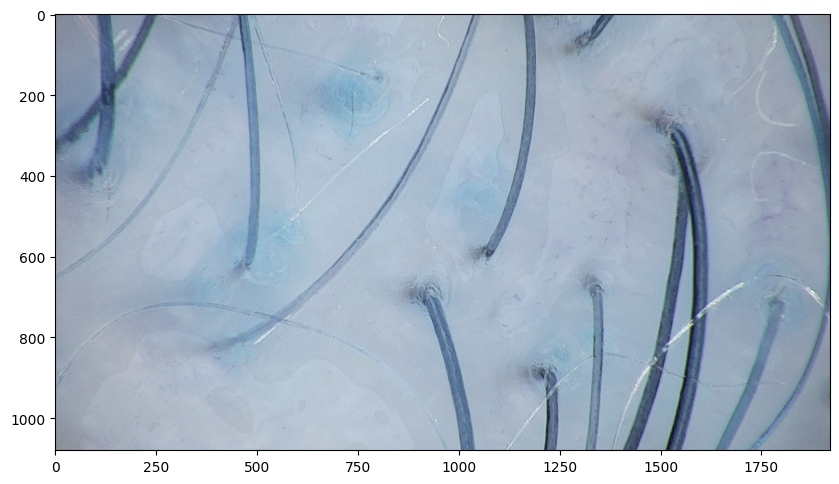

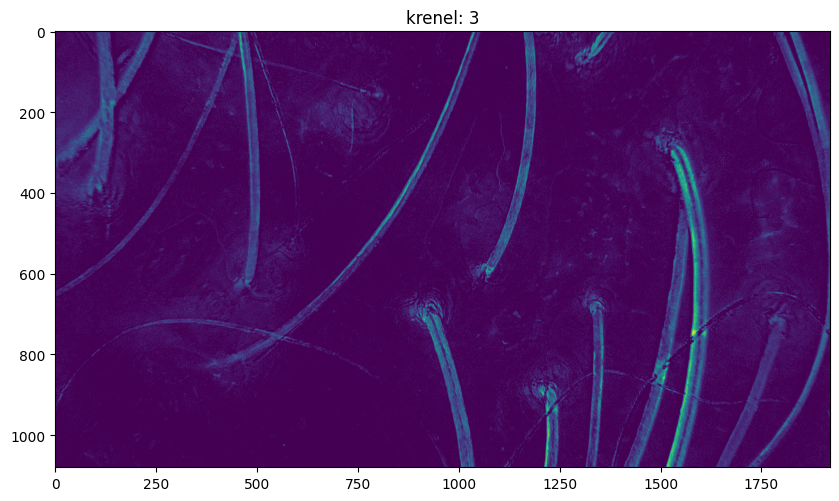

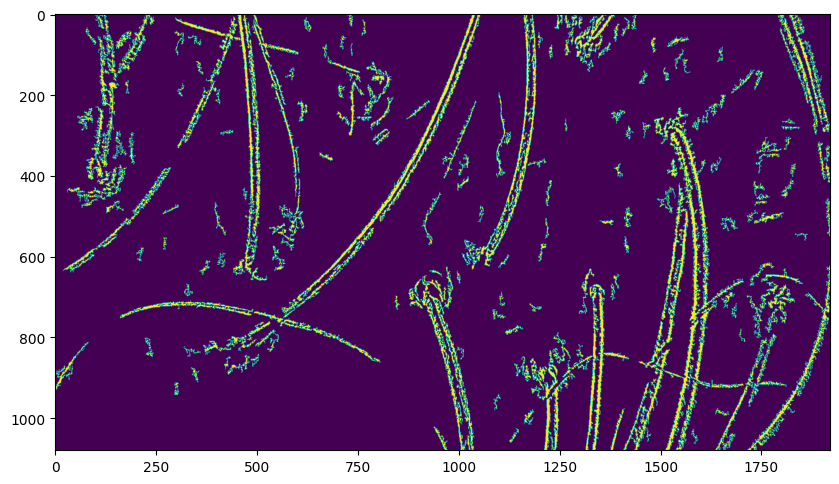

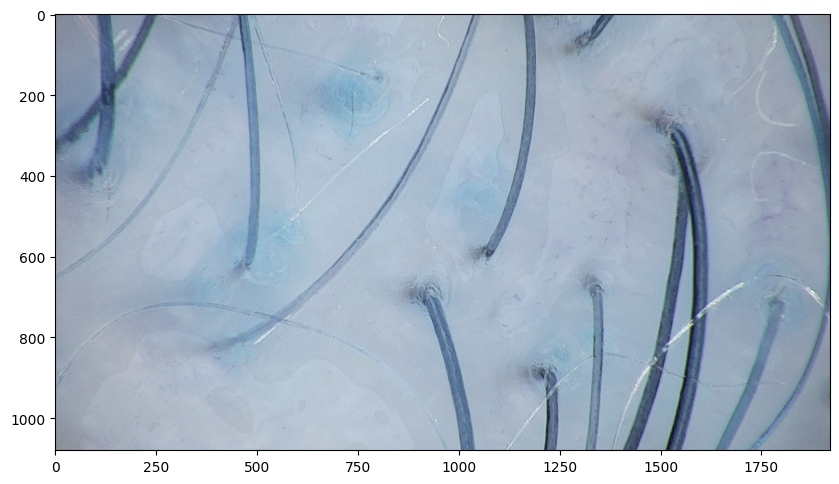

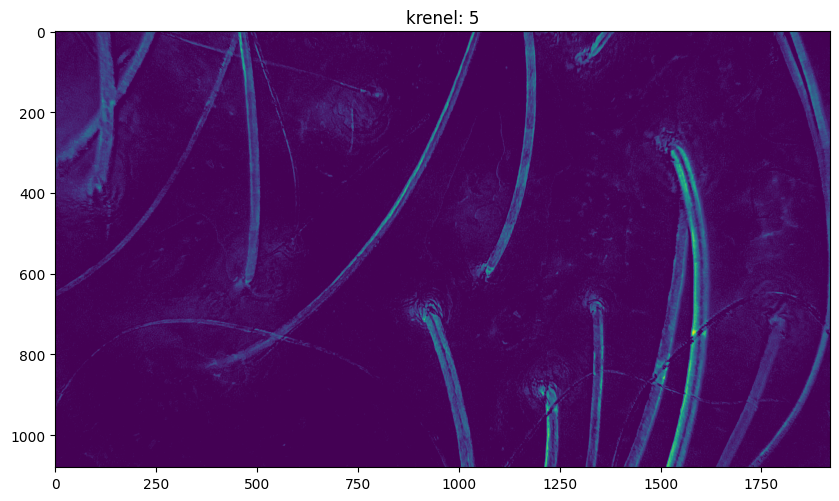

...

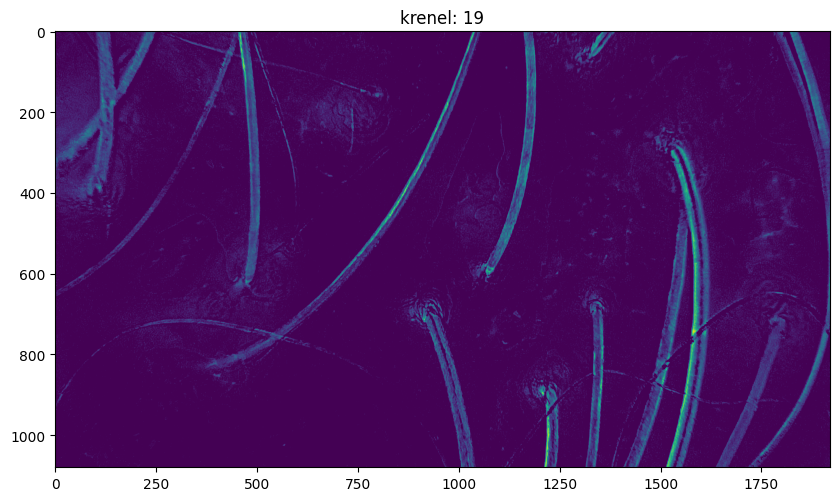

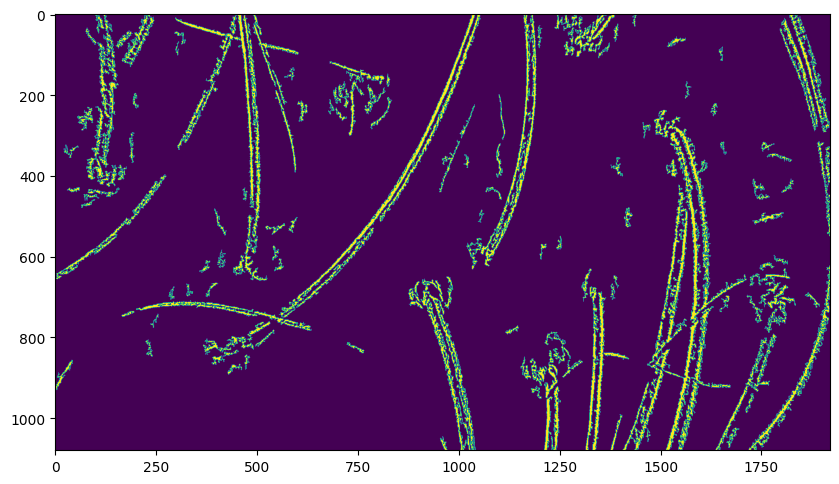

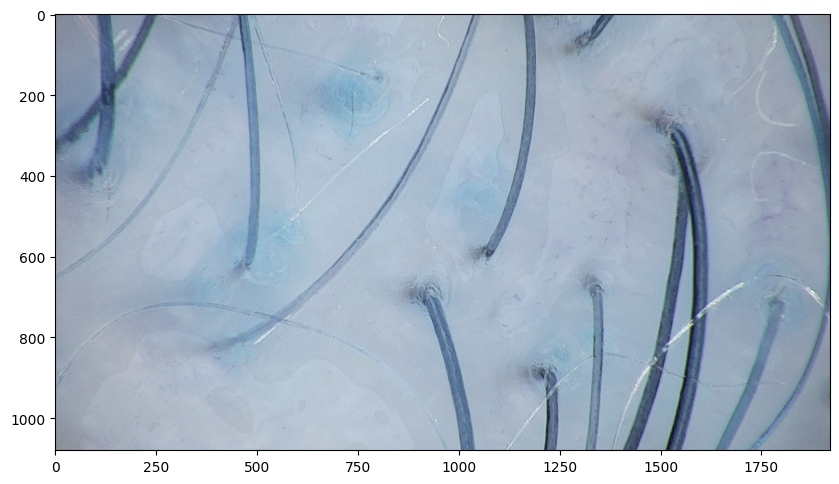

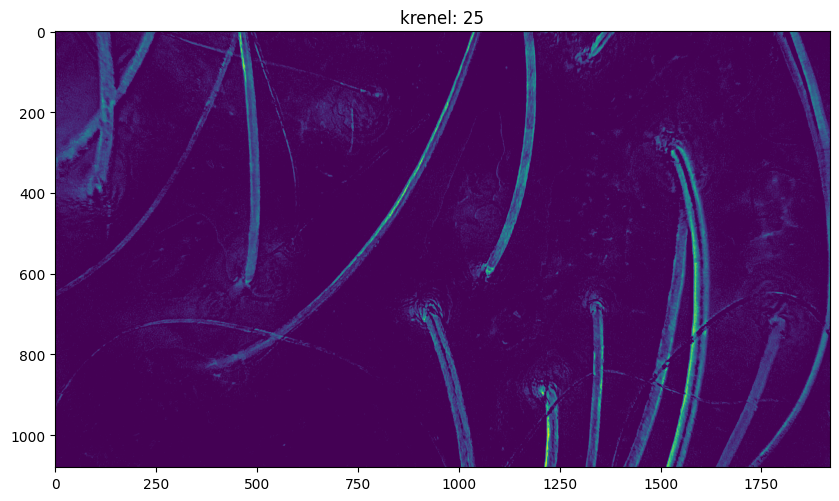

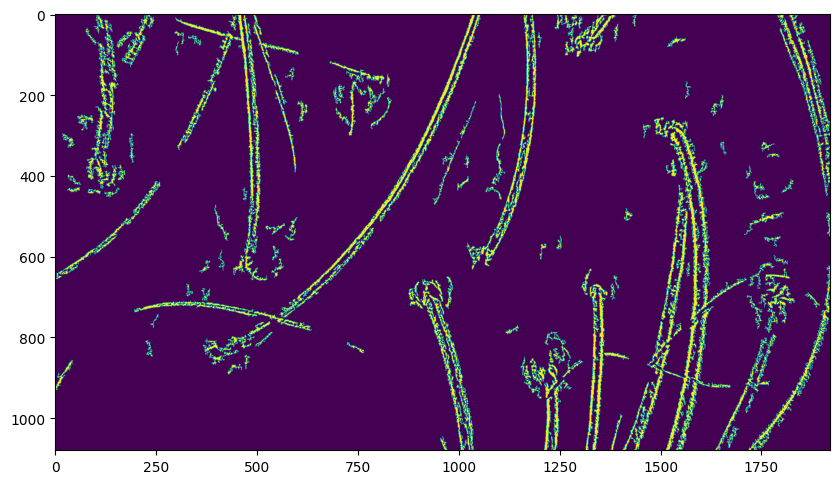

In [29]:
image = cv2.imread("./łysienie/03945.jpg") #03943.jpg
kernelSizes = [3, 5, 7, 9, 13, 15, 19, 25]

for kernelS in kernelSizes:
    red_scaled = preprocess_image(image, kernelS)

    # Step 2: Horizontal & vertical filtering
    blue_plane = image[:, :, 0]  # OpenCV uses BGR format
    horiz_filtered = apply_horizontal_filter(red_scaled, blue_plane)
    vert_filtered = apply_vertical_filter(red_scaled, blue_plane)

    background = estimate_background(horiz_filtered, vert_filtered)
    enhanced_blue = cv2.subtract(background, image[:,:,1])
    white_mask = detect_white_hairs(enhanced_blue, image[:,:,0])

    plt.figure(figsize=(10,8))
    plt.imshow(image)

    plt.figure(figsize=(10,8))
    plt.imshow(enhanced_blue)
    plt.title(f"krenel: {kernelS}")

    plt.figure(figsize=(10,8))
    plt.imshow(white_mask)

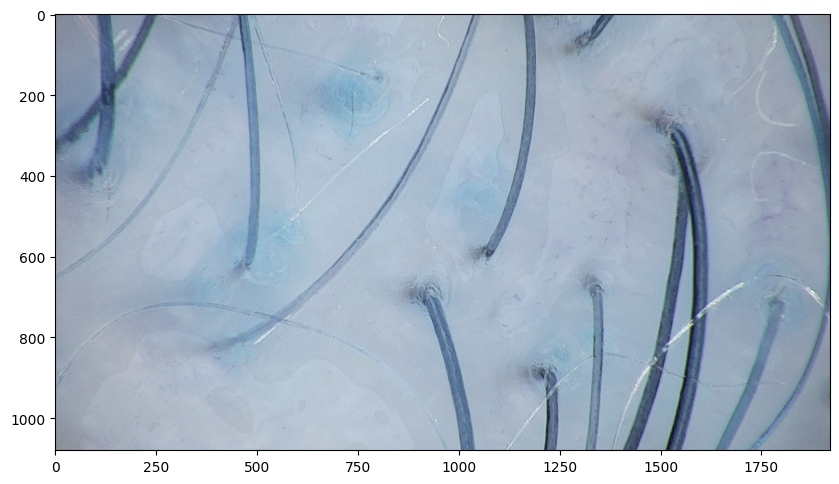

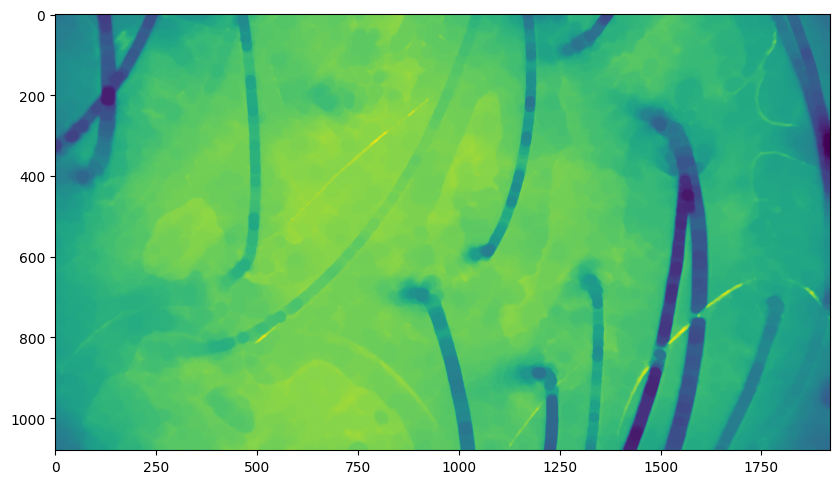

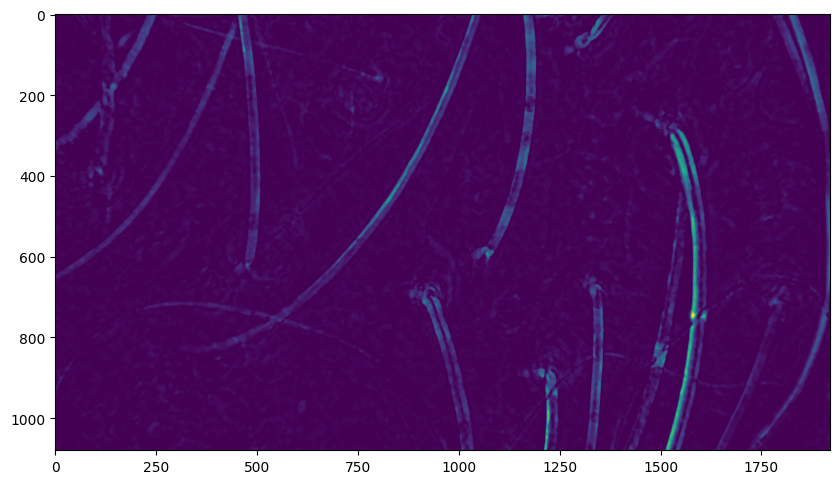

In [3]:
image = cv2.imread("./łysienie/03945.jpg") #03943.jpg

red_scaled = preprocess_image(image)

# Step 2: Horizontal & vertical filtering
blue_plane = image[:, :, 0]  # OpenCV uses BGR format
horiz_filtered = apply_horizontal_filter(red_scaled, blue_plane)
vert_filtered = apply_vertical_filter(red_scaled, blue_plane)

# # # Step 3: Background estimation and hair enhancement
background = estimate_background(horiz_filtered, vert_filtered)
enhanced = enhance_hair(background, red_scaled)

# # # Step 4: Hair segmentation
# hair_mask = directional_gradient_segmentation(enhanced)

# # # Step 5: Ruler mark detection and combine masks
# ruler_mask = detect_ruler_marks(image[:, :, 2])  # Red channel
# combined_mask_1 = cv2.bitwise_or(hair_mask, ruler_mask)

# # Step 6: White hair detection and combine
# white_mask = detect_white_hairs(blue_plane)
# combined_mask_2 = cv2.bitwise_or(combined_mask_1, white_mask)

# # Step 7: Postprocessing to reduce false positives
# final_mask = simple_postprocess_hair_mask(combined_mask_2)

plt.figure(figsize=(10,8))
plt.imshow(image)

# plt.figure(figsize=(10,8))
# plt.imshow(red_scaled)

# plt.figure(figsize=(10,8))
# plt.imshow(horiz_filtered)

# plt.figure(figsize=(10,8))
# plt.imshow(vert_filtered)

plt.figure(figsize=(10,8))
plt.imshow(background)

plt.figure(figsize=(10,8))
plt.imshow(enhanced)

# plt.figure(figsize=(10,8))
# plt.title("hair_mask")
# plt.imshow(hair_mask)

# plt.figure(figsize=(10,8))
# plt.title("ruler_mask")
# plt.imshow(ruler_mask)

# plt.figure(figsize=(10,8))
# plt.title("combined_mask_1")
# plt.imshow(combined_mask_1)

# plt.figure(figsize=(10,8))
# plt.title("combined_mask_2")
# plt.imshow(combined_mask_2)

# kernel = cv2.getStructuringElement(cv2.MORPH_ELLIPSE, (3, 3))
# closed = cv2.morphologyEx(white_mask, cv2.MORPH_DILATE, kernel)

# plt.figure(figsize=(10,8))
# plt.imshow(blue_plane)

# plt.figure(figsize=(10,8))
# plt.imshow(white_mask)

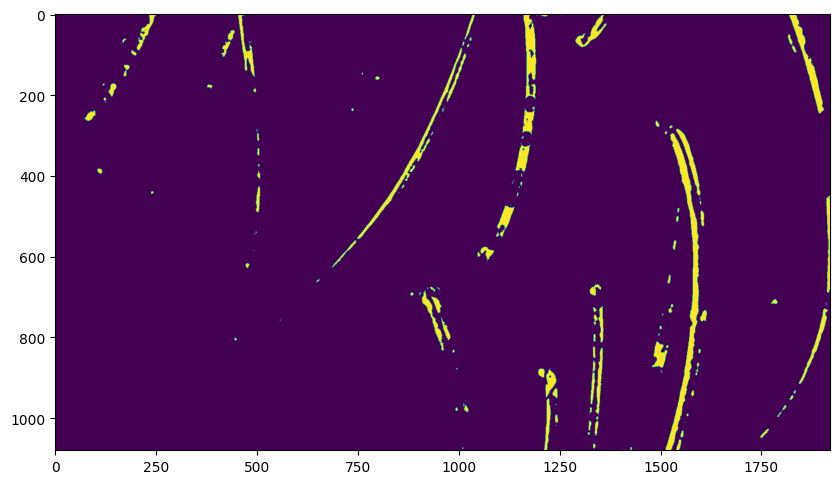

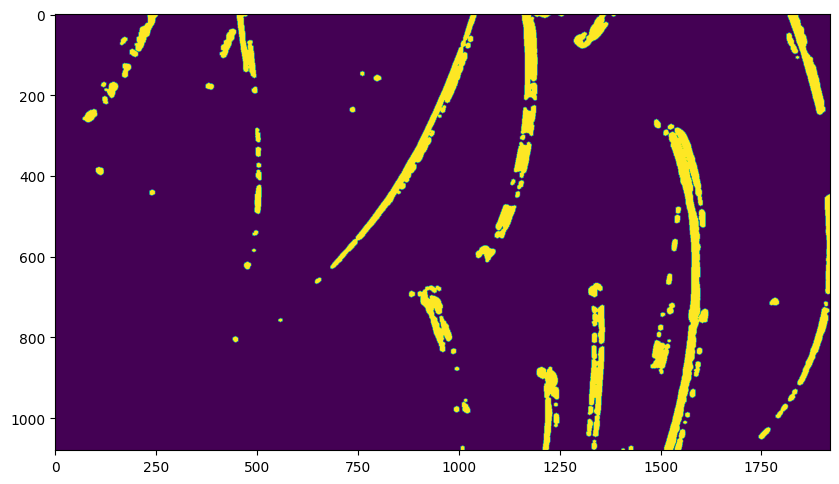

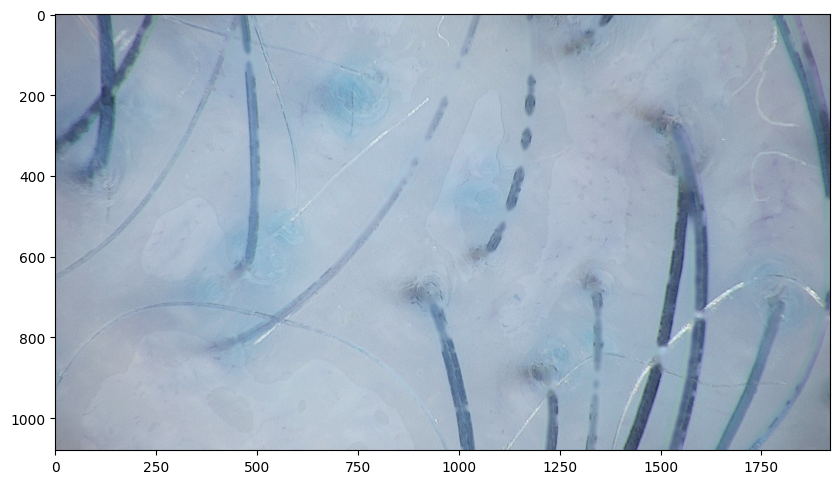

In [12]:
from cv2 import dilate
_, binary_enchanced = cv2.threshold(enhanced, 20, 255, cv2.THRESH_BINARY)
kernel = cv2.getStructuringElement(cv2.MORPH_ELLIPSE, (5, 5))
dilation = cv2.dilate(binary_enchanced, kernel, iterations = 2)
# open = cv2.morphologyEx(binary_enchanced, cv2.MORPH_CLOSE, kernel)

inpainted = cv2.inpaint(image, dilation, 10, cv2.INPAINT_TELEA)

plt.figure(figsize=(10,8))
plt.imshow(binary_enchanced)

plt.figure(figsize=(10,8))
plt.imshow(dilation)

plt.figure(figsize=(10,8))
plt.imshow(inpainted)

Text(0.5, 1.0, '2 - 0')

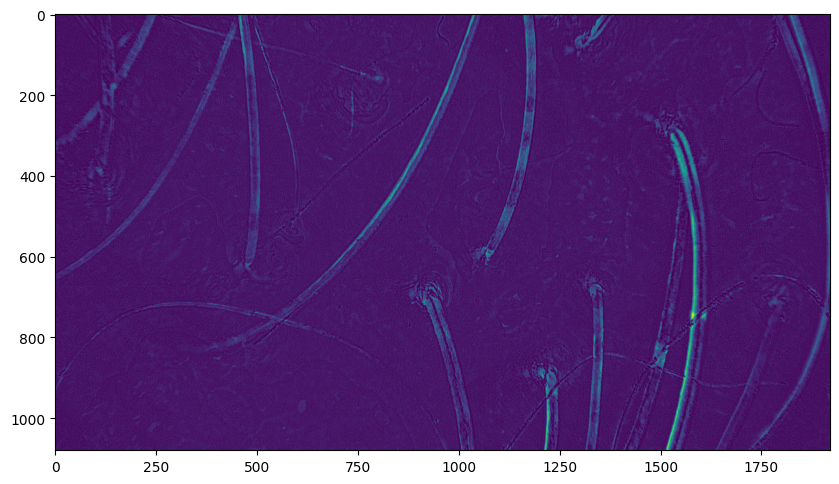

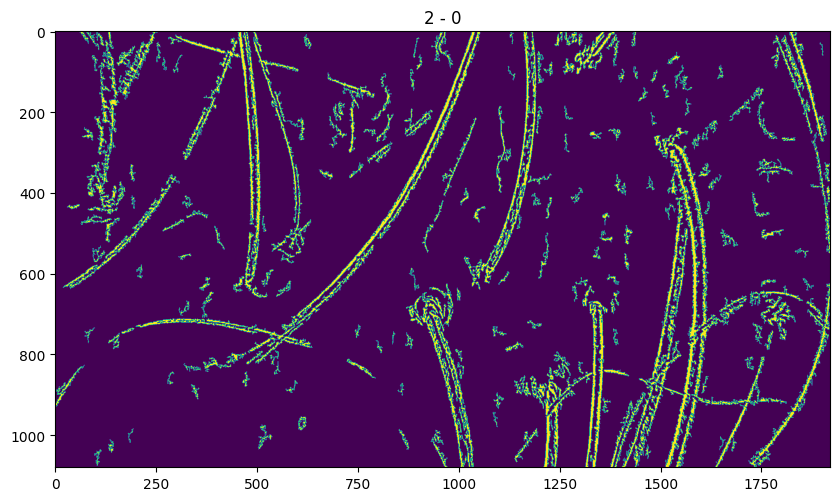

In [29]:
enhanced_blue = cv2.subtract(background, image[:,:,2])
white_mask = detect_white_hairs(enhanced_blue, image[:,:,0])


plt.figure(figsize=(10,8))
plt.imshow(enhanced_blue)

plt.figure(figsize=(10,8))
plt.imshow(white_mask)
plt.title("2 - 0")

In [19]:
def detect_white_hairs(blue_plane: np.ndarray, red_plane: np.ndarray) -> np.ndarray:
    """
    Detect white/light-colored hairs based on the difference between
    the blue channel and its median-filtered version.

    Args:
        blue_plane (np.ndarray): Blue channel of the RGB image

    Returns:
        np.ndarray: Binary mask of white hairs
    """
    blue_plane_copy = blue_plane.copy()
    red_plane_copy = red_plane.copy()

    # Step 1: Median filter
    Igm = cv2.medianBlur(blue_plane_copy, 15)

    # Step 2: White hair enhancement
    WH = cv2.subtract(blue_plane_copy, Igm)

    # # Step 3: Threshold at 1 to binarize
    _, WH_binary = cv2.threshold(WH, 1, 255, cv2.THRESH_BINARY)

    # kernel = cv2.getStructuringElement(cv2.MORPH_RECT, (3, 3))
    # tophat = cv2.morphologyEx(blue_plane, cv2.MORPH_TOPHAT, kernel)

    # _, WH_binary = cv2.threshold(tophat, 1, 255, cv2.THRESH_BINARY)

    # # Step 4: Filter out non-hair-like shapes
    num_labels, labels, stats, centroids = cv2.connectedComponentsWithStats(WH_binary, connectivity=8)
    filtered = np.zeros_like(WH_binary)

    for i in range(1, num_labels):
        x, y, w, h, area = stats[i]

        min_area = 10
        if area < min_area:
            continue

        aspect_ratio = max(w, h)
        eccentricity = aspect_ratio / (min(w, h) + 1e-5)
        rect_area = w * h
        fill_ratio = area / (rect_area + 1e-5)

        # Extract mask of the component
        component_mask = (labels == i).astype(np.uint8)
        # non_245_values = component_mask[component_mask != 0]
        # print(non_245_values)
        # print(component_mask.shape)
        
        # Mask original blue plane to get intensities in this component
        # Extract pixel values from blue and red planes
        component_pixels_blue = blue_plane_copy[component_mask == 1]
        component_pixels_red = red_plane_copy[component_mask == 1]

        # Check if any pixel is darker than 210
        # White hair has high intenstiy value pixel in blue channel - above ~210
        # Dark hair has low intenstiy value pixel in blue channel - below ~120
        if np.any((component_pixels_blue > 150) & (component_pixels_blue < 190)):
            continue  # Discard this componen

        # Skip if any pixel in red channel is ≥ 190
        # if np.any(component_pixels_red >= 0):
        #     continue

        if aspect_ratio > 30 and eccentricity > 0.9 and fill_ratio < 0.8:
            
            # 👇 Print pixel values from WH before binarization
            # component_pixels_wh = WH[component_mask == 1]
            # print(f"Component {i} WH values:", np.unique(component_pixels_wh))

            filtered[labels == i] = 255

    return filtered

In [7]:
white_mask = detect_white_hairs(enhanced_blue, red_scaled)

In [151]:
image[:10,:10]

array([[[11, 10, 12],
        [11, 10, 12],
        [11, 10, 12],
        [11, 10, 12],
        [11, 10, 12],
        [11, 10, 12],
        [11, 10, 12],
        [11, 10, 12],
        [11, 10, 12],
        [11, 10, 12]],

       [[11, 10, 12],
        [11, 10, 12],
        [11, 10, 12],
        [11, 10, 12],
        [11, 10, 12],
        [11, 10, 12],
        [11, 10, 12],
        [11, 10, 12],
        [11, 10, 12],
        [11, 10, 12]],

       [[11, 10, 12],
        [11, 10, 12],
        [11, 10, 12],
        [11, 10, 12],
        [11, 10, 12],
        [11, 10, 12],
        [11, 10, 12],
        [11, 10, 12],
        [11, 10, 12],
        [11, 10, 12]],

       [[11, 10, 12],
        [11, 10, 12],
        [11, 10, 12],
        [11, 10, 12],
        [11, 10, 12],
        [11, 10, 12],
        [11, 10, 12],
        [11, 10, 12],
        [11, 10, 12],
        [11, 10, 12]],

       [[11, 10, 12],
        [11, 10, 12],
        [11, 10, 12],
        [11, 10, 12],
        [11, 10, 12],
  

In [ ]:
# sprobuj jutro - uzyc niebieskiego i czerwonego kanału do wyszukiwania włosów a następnie weź je zsumuj